# Importing Libraries and Environment Setup

Version Check

In [ ]:
import platform
print(platform.python_version())

3.7.10


Import Libraries

In [ ]:
import pandas as pd
import io
import numpy as np
# for plotting
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
# for scaling
from sklearn.preprocessing import StandardScaler
# data splitting
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
# data modeling and results
from sklearn.metrics import confusion_matrix,accuracy_score,roc_curve,classification_report,auc,log_loss, f1_score, recall_score, precision_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
import keras
from keras.models import Sequential
from keras.layers import Dense

# Visualize tree
from sklearn.tree import export_graphviz

# model inspection tool
!pip install shap
!pip install eli5
!pip install pdpbox
import shap #for SHAP values
from pdpbox import pdp, info_plots #for partial plots
import eli5 #for purmutation importance
from eli5.sklearn import PermutationImportance

# ensure reproducibility
np.random.seed(123)

sns.set(style="whitegrid")

     |████████████████████████████████| 358kB 6.9MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491623 sha256=14da5809071552e739e122fd79cb32a9b0c92993018e0c413da7c2fd53ed61a6
  Stored in directory: /root/.cache/pip/wheels/15/27/f5/a8ab9da52fd159aae6477b5ede6eaaec69fd130fa0fa59f283
Successfully built shap
     |████████████████████████████████| 112kB 6.8MB/s 
     |████████████████████████████████| 34.0MB 109kB/s 
     |████████████████████████████████| 13.1MB 334kB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-cp37-none-any.whl size=35758228 sha256=41271beaf704853a5703169915db5f4cfc426f88a9067fd5a9ffb4fa8b0a7020
  Stored in directory: /root/.cache/pip/wheels/c8/13/11/ecac74c6192790c94f6f5d919f1a388f927b9febb690e45eef
Successfully built pdpbox
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:

### Filter Warning Messages

In [ ]:
import warnings
warnings.filterwarnings('ignore')

# Data Collection and Preprocessing

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving All data UCI.xlsx to All data UCI.xlsx


### Save the Cleveland, Switzerland, Hungarian and Long Beach dataset and get their basic stats

In [ ]:
pd.set_option('display.max_columns', None)
df1 = pd.read_excel(uploaded['All data UCI.xlsx'], header=None, names=['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang',
      'oldpeak', 'slope', 'ca', 'thal', 'num'], sheet_name='Cleveland processed')
df2 = pd.read_excel(uploaded['All data UCI.xlsx'], header=None, names=['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang',
      'oldpeak', 'slope', 'ca', 'thal', 'num'], sheet_name='Swit Processed')
df3 = pd.read_excel(uploaded['All data UCI.xlsx'], header=None, names=['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang',
      'oldpeak', 'slope', 'ca', 'thal', 'num'], sheet_name='Hungarian reprocessed')
df4 = pd.read_excel(uploaded['All data UCI.xlsx'], header=None, sheet_name='VA processed', usecols=[0,1,2,3,4,5,6,7,8,9,10,11,12,13], names=['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang',
      'oldpeak', 'slope', 'ca', 'thal', 'num'])
print('*'*5,'Cleveland Dataset Summary','*'*5)
print('The shape of the dataframe is - {}'.format(df1.shape))
print('The number of entries - {}'.format(df1.size))
print('-'*60)
print('The basic statistics -\n{}'.format(df1.describe()))
print('-'*60)
print('Unique values per column -\n{}'.format(df1.nunique()))
print('-'*60)
print('Null values per column -\n{}'.format(df1.isnull().sum()))
print('-'*60)
print('Data types per column -\n{}'.format(df1.dtypes))
print('\n{}\n'.format('-*-'*10))
print('*'*5,'Switzerland Dataset Summary','*'*5)
print('The shape of the dataframe is - {}'.format(df2.shape))
print('The number of entries - {}'.format(df2.size))
print('-'*60)
print('The basic statistics -\n{}'.format(df2.describe()))
print('-'*60)
print('Unique values per column -\n{}'.format(df2.nunique()))
print('-'*60)
print('Null values per column -\n{}'.format(df2.isnull().sum()))
print('-'*60)
print('Data types per column -\n{}'.format(df2.dtypes))
print('\n{}\n'.format('-*-'*10))
print('*'*5,'Hungarian Dataset Summary','*'*5)
print('The shape of the dataframe is - {}'.format(df3.shape))
print('The number of entries - {}'.format(df3.size))
print('-'*60)
print('The basic statistics -\n{}'.format(df3.describe()))
print('-'*60)
print('Unique values per column -\n{}'.format(df3.nunique()))
print('-'*60)
print('Null values per column -\n{}'.format(df3.isnull().sum()))
print('-'*60)
print('Data types per column -\n{}'.format(df3.dtypes))
print('\n{}\n'.format('-*-'*10))
print('*'*5,'VA long beach Dataset Summary','*'*5)
print('The shape of the dataframe is - {}'.format(df4.shape))
print('The number of entries - {}'.format(df4.size))
print('-'*60)
print('The basic statistics -\n{}'.format(df4.describe()))
print('-'*60)
print('Unique values per column -\n{}'.format(df4.nunique()))
print('-'*60)
print('Null values per column -\n{}'.format(df4.isnull().sum()))
print('-'*60)
print('Data types per column -\n{}'.format(df4.dtypes))
print('\n{}\n'.format('-*-'*10))

***** Cleveland Dataset Summary *****
The shape of the dataframe is - (303, 14)
The number of entries - 4242
------------------------------------------------------------
The basic statistics -
              age         sex          cp    trestbps        chol         fbs  \
count  303.000000  303.000000  303.000000  303.000000  303.000000  303.000000   
mean    54.438944    0.679868    3.158416  131.689769  246.693069    0.148515   
std      9.038662    0.467299    0.960126   17.599748   51.776918    0.356198   
min     29.000000    0.000000    1.000000   94.000000  126.000000    0.000000   
25%     48.000000    0.000000    3.000000  120.000000  211.000000    0.000000   
50%     56.000000    1.000000    3.000000  130.000000  241.000000    0.000000   
75%     61.000000    1.000000    4.000000  140.000000  275.000000    0.000000   
max     77.000000    1.000000    4.000000  200.000000  564.000000    1.000000   

          restecg     thalach       exang     oldpeak       slope         num

### Join all the four datasets and view

In [ ]:
df=pd.concat([df1,df2,df3,df4]).reset_index(drop=True)
df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,num
0,63,1,1,145,233,1,2,150,0,2.3,3,0,6,0
1,67,1,4,160,286,0,2,108,1,1.5,2,3,3,2
2,67,1,4,120,229,0,2,129,1,2.6,2,2,7,1
3,37,1,3,130,250,0,0,187,0,3.5,3,0,3,0
4,41,0,2,130,204,0,2,172,0,1.4,1,0,3,0


### Get a Summary of the Combined Dataset

In [ ]:
print('The shape of the dataframe is - {}'.format(df.shape))
print('The number of entries - {}'.format(df.size))
print('-'*60)
print('The basic statistics -\n{}'.format(df.describe(include='all')))
print('-'*60)
print('Unique values per column -\n{}'.format(df.nunique()))
print('-'*60)
print('Null values per column -\n{}'.format(df.isnull().sum()))
print('-'*60)
print('Data types per column -\n{}'.format(df.dtypes))

The shape of the dataframe is - (920, 14)
The number of entries - 12880
------------------------------------------------------------
The basic statistics -
               age         sex          cp  trestbps   chol    fbs  restecg  \
count   920.000000  920.000000  920.000000     920.0  920.0  920.0    920.0   
unique         NaN         NaN         NaN      63.0  219.0    4.0      5.0   
top            NaN         NaN         NaN     120.0    0.0    0.0      0.0   
freq           NaN         NaN         NaN     131.0  172.0  692.0    551.0   
mean     53.510870    0.789130    3.250000       NaN    NaN    NaN      NaN   
std       9.424685    0.408148    0.930969       NaN    NaN    NaN      NaN   
min      28.000000    0.000000    1.000000       NaN    NaN    NaN      NaN   
25%      47.000000    1.000000    3.000000       NaN    NaN    NaN      NaN   
50%      54.000000    1.000000    4.000000       NaN    NaN    NaN      NaN   
75%      60.000000    1.000000    4.000000       NaN  

### Missing Values
The missing values are coded as -9.0 or '?'. Therefore even if the summary shows no missing values there actually is. A column wise and row wise summary of missing values is to be obtained

In [ ]:
print('Column wise missing values Sum-\n{}'.format(df.isin(['?', -9]).sum(axis=0)))
print('Number of rows containing at least one missing value-\n{}'.format(df.isin(['?', -9]).any(axis=1).sum()))

Column wise missing values Sum-
age           0
sex           0
cp            0
trestbps     59
chol         30
fbs          90
restecg       2
thalach      55
exang        55
oldpeak      62
slope       309
ca          610
thal        486
num           0
dtype: int64
Number of rows containing at least one missing value-
621


Drop the columns thal, ca and slope due to large no of missing values and save it to a dataframe called dt1.

In [ ]:
# Replace '?' and -9 with NaN
df.replace(['?', -9], np.NaN, inplace=True)
# create dt1 without the three columns and then exclude the rows with missing values from rest of the columns
dt1 = df.drop(['ca', 'thal', 'slope'], axis=1)
dt1.dropna(axis=0, inplace=True)

Plotting a frequency histogram to check for more inconsistencies

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f8660e37f90>,
      dtype=object)

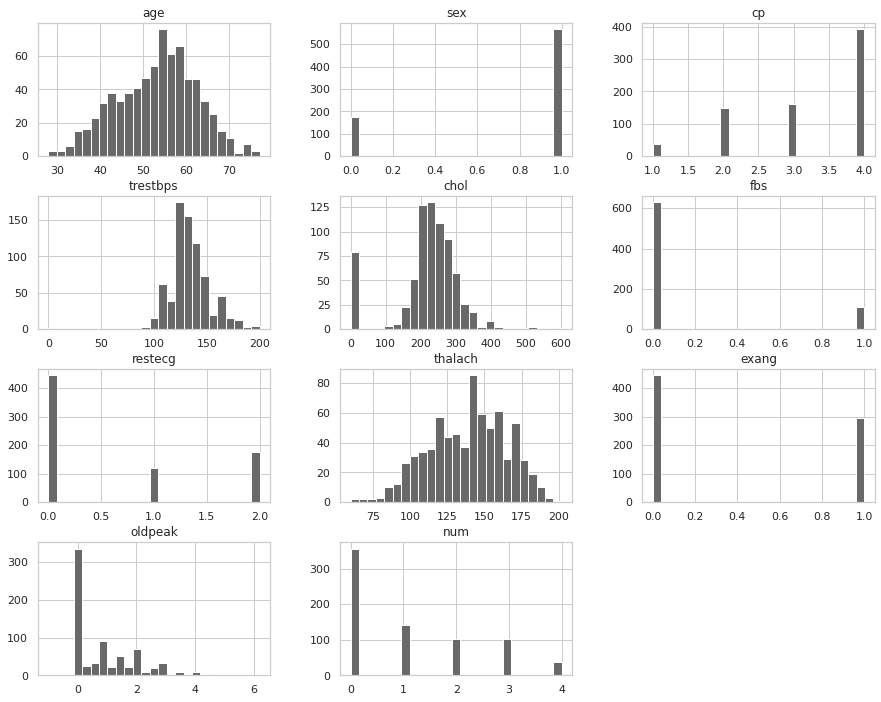

In [ ]:
dt1.hist(bins=25, grid=True, figsize=(15,12), color='#696969', rwidth=1.0)

Cholesterol cannot be zero in a human body. Therefore, we need to see what unique values each column contains so that we can detect more invalid data points

Check all the unique values

In [ ]:
col_list = dt1.columns
for i in col_list:
  print('Unique values in column {}'.format(i))
  print('*-*'*5)
  print(dt1[i].unique())

Unique values in column age
*-**-**-**-**-*
[63 67 37 41 56 62 57 53 44 52 48 54 49 64 58 60 50 66 43 40 69 59 42 55
 61 65 71 51 46 45 39 68 47 34 35 29 70 77 38 74 76 73 36 32 31 33 28 30
 72 75]
Unique values in column sex
*-**-**-**-**-*
[1 0]
Unique values in column cp
*-**-**-**-**-*
[1 4 3 2]
Unique values in column trestbps
*-**-**-**-**-*
[145. 160. 120. 130. 140. 172. 150. 110. 132. 117. 135. 112. 105. 124.
 125. 142. 128. 170. 155. 104. 180. 138. 108. 134. 122. 115. 118. 100.
 200.  94. 165. 102. 152. 101. 126. 174. 148. 178. 158. 192. 129. 144.
 123. 136. 146. 106. 156. 154. 114. 164. 185. 190.  92.  98. 116.   0.
  96. 127.]
Unique values in column chol
*-**-**-**-**-*
[233. 286. 229. 250. 204. 236. 268. 354. 254. 203. 192. 294. 256. 263.
 199. 168. 239. 275. 266. 211. 283. 284. 224. 206. 219. 340. 226. 247.
 167. 230. 335. 234. 177. 276. 353. 243. 225. 302. 212. 330. 175. 417.
 197. 198. 290. 253. 172. 273. 213. 305. 216. 304. 188. 282. 185. 232.
 326. 231. 269. 267. 248.

Cholesterol and resting blood pressure shouldn't be zero! Lets see how many of them are zero -

In [ ]:
print('number of zeroes in cholesterol - {}'.format(dt1['chol'].isin([0]).sum()))
print('number of zeroes in resting blood pressure - {}'.format(dt1['trestbps'].isin([0]).sum()))

number of zeroes in cholesterol - 79
number of zeroes in resting blood pressure - 1


Presumably, these are the hidden missing values which demands to be dealt with. Since the number is less, better to drop them

In [ ]:
dt1[['chol', 'trestbps']]=dt1[['chol', 'trestbps']].replace([0], np.NaN)
dt1.dropna(axis=0, inplace=True)
print('Size of remaining dataset -\n{}'.format(dt1.shape))

Size of remaining dataset -
(661, 11)


Lets progress with this remaining data to analysis

### Exploratory Data Analysis

Check the target variable

In [ ]:
dt1['num'].value_counts()

0    347
1    119
3     82
2     80
4     33
Name: num, dtype: int64

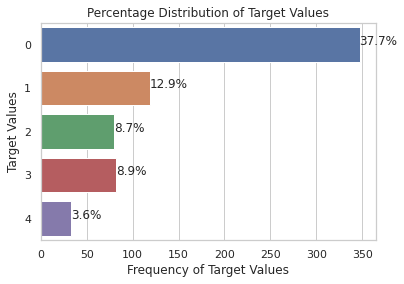

In [ ]:
ax = sns.countplot(y="num", data=dt1)
plt.title('Percentage Distribution of Target Values')
plt.xlabel('Frequency of Target Values')
plt.ylabel('Target Values')

total = len(df['num'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 0.02
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()

### From Multiclass classification Problem to Binary Classification Problem
1,2,3,4 are different types of heart diseases and as observed, there is a class imbalance problem which will be resolved if all the types are merged into a single variable denoting the presence of heart disease.

In [ ]:
dt1['num'] = dt1['num'].replace([1, 2, 3, 4], 1)
dt1.num.unique()

array([0, 1])

Now, lets check the value count for target variable again!

In [ ]:
dt1['num'].value_counts()

0    347
1    314
Name: num, dtype: int64

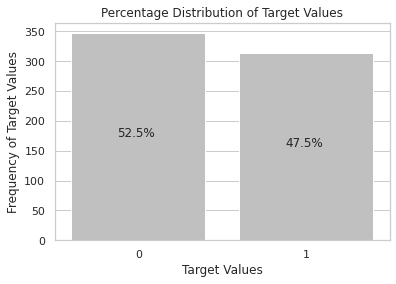

661


In [ ]:
ax = sns.countplot(x="num", data=dt1, color='#C0C0C0')
plt.title('Percentage Distribution of Target Values')
plt.xlabel('Target Values')
plt.ylabel('Frequency of Target Values')

total = len(dt1['num'])
for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width()/2.9
        y = p.get_y() + p.get_height()/2
        ax.annotate(percentage, (x, y))

plt.show()
print(total)

### Lets Check the relationship between sex and target variables -
To check if the dataset is a good representative of true population

In [ ]:
dt1.groupby('sex')['num'].value_counts()

sex  num
0    0      131
     1       40
1    1      274
     0      216
Name: num, dtype: int64

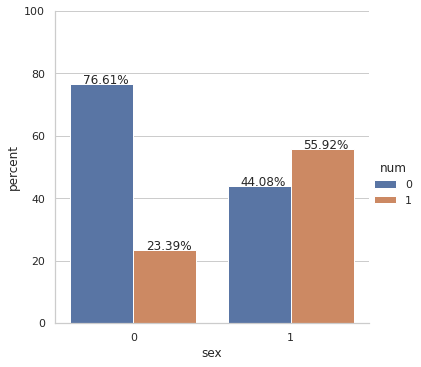

In [ ]:
x,y = 'sex', 'num'

df1 = dt1.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

g = sns.catplot(x=x,y='percent',hue=y,kind='bar',data=df1)
g.ax.set_ylim(0,100)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() + p.get_width()/5
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

So, it is seen that males have higher chances of developing CAD than females. 

### Relationship between age and target

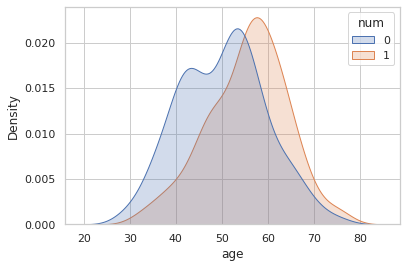

In [ ]:
sns.kdeplot(data=dt1, x='age', hue='num', shade=True)

Another way to take a detailed look -

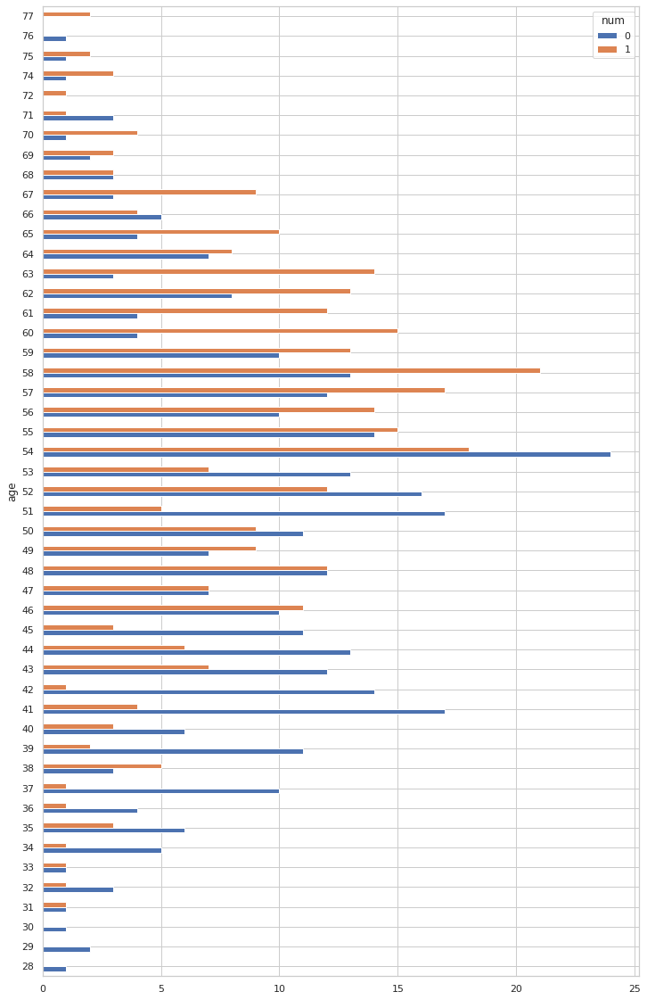

In [ ]:
pd.crosstab(dt1.age, dt1.num).plot.barh(figsize=(12,20))

As expected, the chances of getting diagnosed with CAD is higher in older population. Now, lets have a look on how age, sex and target variable is related -

### Relationship among age, sex and target variable

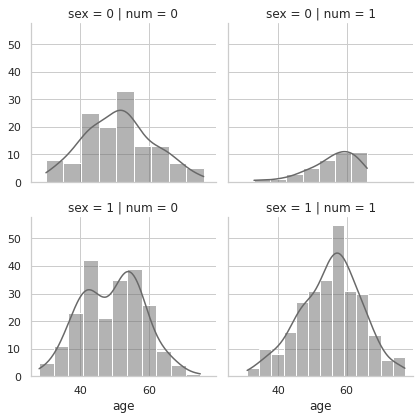

In [ ]:
g = sns.FacetGrid(dt1, col='num', row='sex')
g.map(sns.histplot, 'age', kde=True, color='#696969')

This shows, irrespective of sex higher aged men and women are at higher risks of developing CAD.


### Correlation
A heatmap of correlations is generated among all the variables

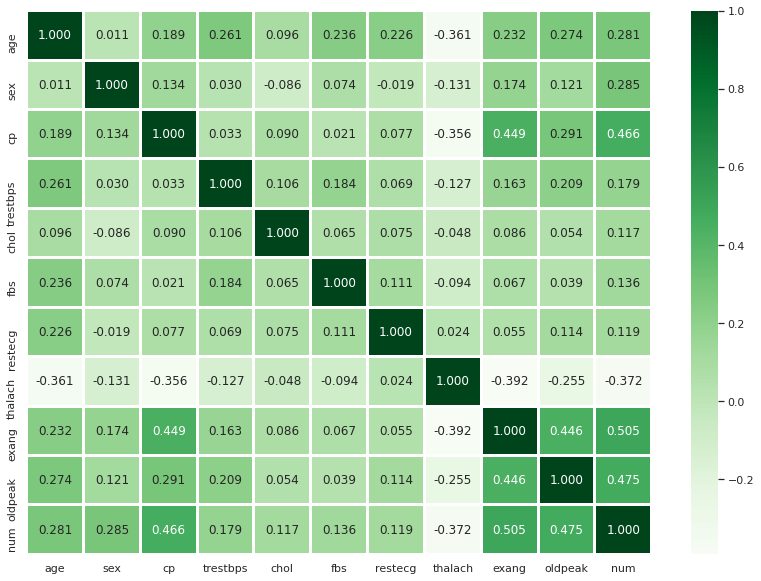

In [ ]:
plt.figure(figsize=(14,10))
sns.heatmap(dt1.corr(),annot=True,cmap='Greens',fmt='.3f',linewidths=2)

Frequency Histogram of all variables -

In [ ]:
dt1.sex.value_counts()

1    490
0    171
Name: sex, dtype: int64

### Pairplot
A paiplot of continuous variables is generated

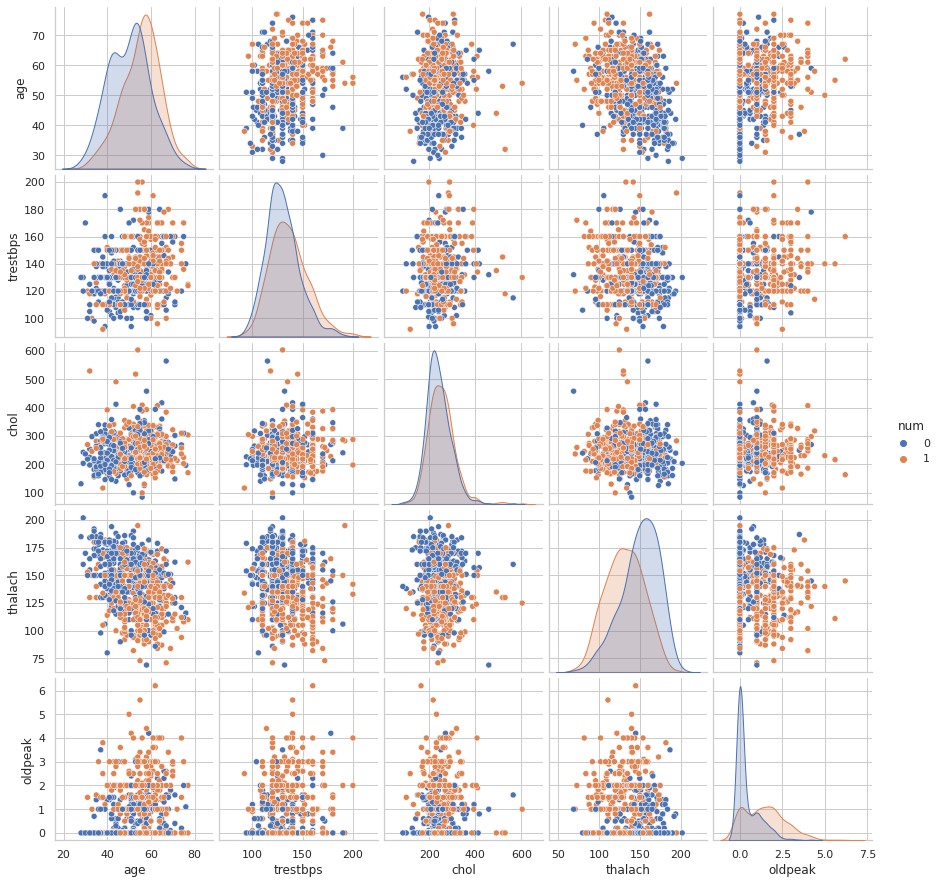

In [ ]:
sns.pairplot(dt1, vars=('age','trestbps','chol','thalach','oldpeak'), hue='num', diag_kind='kde')

Note: Slight positive and negative correlations exist between some variable pairs

### Scaling and Datatypes adjustment

Some of the data types aren't right. Lets fix them

In [ ]:
dt1[['sex', 'cp', 'fbs',	'restecg', 'exang',	'num']] = dt1[['sex', 'cp', 'fbs',	'restecg', 'exang',	'num']].astype('category')
dt1[['age', 'trestbps', 'chol', 'thalach']] = dt1[['age', 'trestbps', 'chol', 'thalach']].astype('int64')
dt1['oldpeak'] = dt1['oldpeak'].astype(float)
dt1.dtypes

age            int64
sex         category
cp          category
trestbps       int64
chol           int64
fbs         category
restecg     category
thalach        int64
exang       category
oldpeak      float64
num         category
dtype: object

In [ ]:
scaler = StandardScaler()
scaled_X = scaler.fit_transform(dt1.drop('num', 1))

### Finding Outliers

Find and eliminate outliers using DBScan

Using nearest neighbors to find best parameter for dbscan

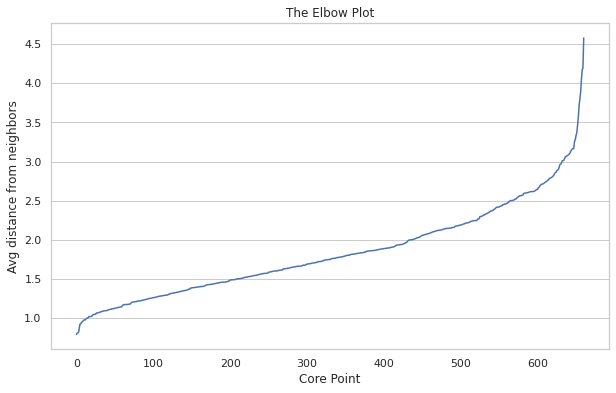

In [ ]:
# Storing the distance to the 6th nearest neaighbor to the distance variable
neigh = NearestNeighbors(n_neighbors=20)   # Classifier implementing the 6-nearest neighbors vote
nbrs = neigh.fit(scaled_X)
distances, indices = nbrs.kneighbors(scaled_X)
distances = np.sort(distances, axis=0)
distances = distances[:,5]
# Generate the elbow plot
plt.figure(figsize=(10,6))
plt.plot(distances)
plt.title('The Elbow Plot')
plt.xlabel('Core Point')
plt.ylabel('Avg distance from neighbors')
#plt.yticks(np.arange(0.2, 1.6, 0.1))      # Increase density of yticks to help meausuring elbow values visually
plt.grid(axis='x')                        # Display gridlines to help meausuring elbow values visually
plt.show()

DBSCAN

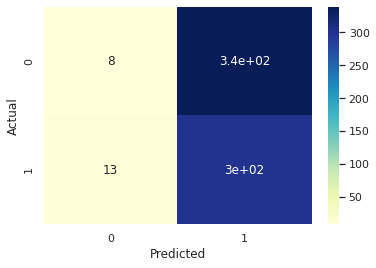


 ****************************** Classification Report ****************************** 

              precision    recall  f1-score   support

           0       0.38      0.02      0.04       347
           1       0.47      0.96      0.63       314

    accuracy                           0.47       661
   macro avg       0.43      0.49      0.34       661
weighted avg       0.42      0.47      0.32       661



In [ ]:
dbscan = DBSCAN(eps=2.9, min_samples=20)
dbscan.fit(scaled_X)
label = dbscan.labels_
# Plot a confusion matrix
df = pd.DataFrame({'Actual': dt1['num'], 'Predicted': label+1})
ct = pd.crosstab(df['Actual'], df['Predicted'])
sns.heatmap(ct, annot=True, cmap="YlGnBu")
plt.show()
# Display the classification report
print('\n', '*'*30, 'Classification Report', '*'*30, '\n')
print(classification_report(df['Actual'], df['Predicted']))

In [ ]:
ind = df.loc[(df.Predicted==0) | (df.Predicted==1)]
dt4 = dt1[dt1.index.isin(ind.index)]

In [ ]:
Scaled_X = scaler.fit_transform(dt4.drop('num', 1))
print('Shape of feature dataset is {}'.format(Scaled_X.shape))

Shape of feature dataset is (661, 10)


No outliers were found and the operation gives out the earlier dataset as it was

### Train Test Split

In [ ]:
# for models who require scaling
X_train, X_test, y_train, y_test = train_test_split(scaled_X, dt1['num'], test_size = .3, random_state=10)
# preserve the unscaled data
X_train_uns, X_test_uns, y_train_uns, y_test_uns = train_test_split(dt1.drop('num',1), dt1['num'], test_size = .3, random_state=10)
feature_names = [i for i in dt1.drop('num', 1).columns]
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(462, 10) (199, 10) (462,) (199,)


# Model Building

We'll try to predict the presence of CAD in a person from the following features - 

1. (age) age in years
2. (sex) sex (1 = male; 0 = female)
3. (cp) cp: chest pain type
-- Value 1: typical angina

-- Value 2: atypical angina

-- Value 3: non-anginal pain

-- Value 4: asymptomatic
4. (trestbps) trestbps: resting blood pressure (in mm Hg on admission to the hospital)
5. (chol) serum cholestoral in mg/dl
6. (fbs) (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)
7. (restecg) resting electrocardiographic results

-- Value 0: normal

-- Value 1: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of >
0.05 mV)

-- Value 2: showing probable or definite left ventricular hypertrophy by Estes' criteria
8. (thalach) thalach: maximum heart rate achieved
9. (exang) exang: exercise induced angina (1 = yes; 0 = no)
10. (oldpeak) oldpeak = ST depression induced by exercise relative to rest

The target is to predict CAD. The coding of target variable is -

(num) (the predicted attribute) diagnosis of heart disease (angiographic disease status)
-- Value 0: < 50% diameter narrowing

-- Value 1: > 50% diameter narrowing


### Random Forest Classifier

Find the best hyperparameters using Grid search and 5 fold Cross Validation

In [ ]:
model = RandomForestClassifier(random_state=8)
param_grid = { 
    'n_estimators': [100, 250, 500, 700],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}
CV_rfc = GridSearchCV(estimator=model, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=8,
                                   

In [ ]:
CV_rfc.best_params_

{'criterion': 'gini',
 'max_depth': 4,
 'max_features': 'auto',
 'n_estimators': 700}

Building the classifier with the best parameters

In [ ]:
rf = RandomForestClassifier(random_state=8, criterion='gini', max_depth=4, max_features='auto', n_estimators=700)
rf.fit(X_train, y_train)
rf_predict = rf.predict(X_test)

Obtain confusion matrix

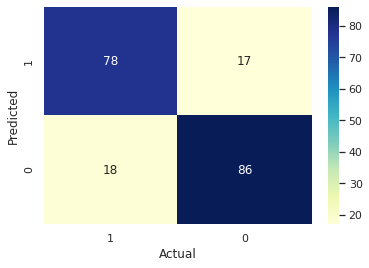

In [ ]:
rfcm = pd.DataFrame({'Actual': y_test, 'Predicted': rf_predict})
rfct = pd.crosstab(rfcm['Predicted'], rfcm['Actual'])
# Rearrange columns of ct
rfct = rfct[[1,0]]
rfct = rfct.reindex([1,0])
# Get the heatmap
sns.heatmap(rfct, annot=True, cmap="YlGnBu", fmt='g')

Classification Report

In [ ]:
rf_acc_score = accuracy_score(y_test, rf_predict)
rf_f1_score = f1_score(y_test, rf_predict)
rf_pre_score = precision_score(y_test, rf_predict)
rf_rec_score = recall_score(y_test, rf_predict)
print("\n")
print("Accuracy of random Forest:",rf_acc_score*100,'\n')
print(classification_report(y_test, rf_predict))



Accuracy of random Forest: 82.41206030150754 

              precision    recall  f1-score   support

           0       0.83      0.83      0.83       103
           1       0.82      0.81      0.82        96

    accuracy                           0.82       199
   macro avg       0.82      0.82      0.82       199
weighted avg       0.82      0.82      0.82       199



Visualize a tree from the random forest

In [ ]:
estimator = rf.estimators_[2]

y_train_str = y_train.astype('str')
y_train_str[y_train_str == '0'] = 'no disease'
y_train_str[y_train_str == '1'] = 'disease'
y_train_str = y_train_str.values

# Exporting as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = y_train_str,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in notebook
from IPython.display import Image
Image(filename = 'tree.png')

### Support Vector Classifier

Find the best hyperparameters using Grid search and 5 fold Cross Validation

In [ ]:
svc =  SVC(random_state=2)
param_grid = { 
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'C': [0.001, 0.01, 0.1, 1],
    'gamma' : ['scale', 'auto'],
}
CV_svc = GridSearchCV(estimator=svc, param_grid=param_grid, cv= 5)
CV_svc.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=2, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1], 'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
CV_svc.best_params_

{'C': 0.1, 'gamma': 'scale', 'kernel': 'rbf'}

Fitting with the best found hyperparameters

In [ ]:
svc = SVC(C=0.1, kernel='rbf', gamma='scale')
svc.fit(X_train, y_train)
svc_predict = svc.predict(X_test)

Obtain a confusion matrix

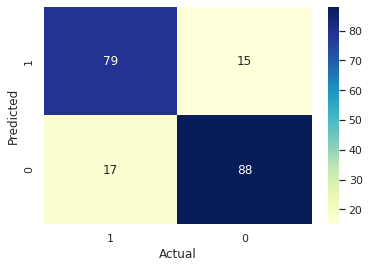

In [ ]:
svmcm = pd.DataFrame({'Actual': y_test, 'Predicted': svc_predict})
svmct = pd.crosstab(svmcm['Predicted'], svmcm['Actual'])
# Rearrange columns of ct
svmct = svmct[[1,0]]
svmct = svmct.reindex([1,0])
# Get the heatmap
sns.heatmap(svmct, annot=True, cmap="YlGnBu", fmt='g')

Get the classification report

In [ ]:
svc_acc_score = accuracy_score(y_test, svc_predict)
svc_f1_score = f1_score(y_test, svc_predict)
svc_pre_score = precision_score(y_test, svc_predict)
svc_rec_score = recall_score(y_test, svc_predict)
print("\n")
print("Accuracy of Support Vector Classifier:",svc_acc_score*100,'\n')
print(classification_report(y_test,svc_predict))



Accuracy of Support Vector Classifier: 83.91959798994975 

              precision    recall  f1-score   support

           0       0.84      0.85      0.85       103
           1       0.84      0.82      0.83        96

    accuracy                           0.84       199
   macro avg       0.84      0.84      0.84       199
weighted avg       0.84      0.84      0.84       199



### Logistic Regression

Find the best hyperparameters using Grid search and 5 fold Cross Validation

In [ ]:
lr = LogisticRegression()
param_grid = { 
    "C": [0.001, 0.01, 0.1, 1],
    "penalty": ["l1", "l2", 'elasticnet'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
}
lr_svc = GridSearchCV(estimator=lr, param_grid=param_grid, cv= 5)
lr_svc.fit(X_train, y_train)


GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=

In [ ]:
lr_svc.best_params_

{'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}

Build the model with the best hyperparameters

In [ ]:
lr = LogisticRegression(C=0.01, penalty='l2', solver='liblinear')
lr.fit(X_train, y_train)
lr_predict = lr.predict(X_test)

Obtain a confusion matrix

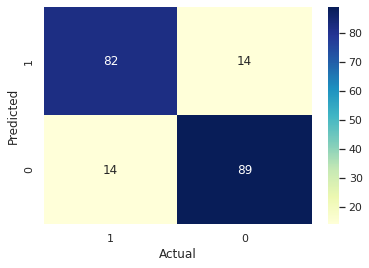

In [ ]:
lrcm = pd.DataFrame({'Actual': y_test, 'Predicted': lr_predict})
lrct = pd.crosstab(lrcm['Predicted'], lrcm['Actual'])
# Rearrange columns of ct
lrct = lrct[[1,0]]
lrct = lrct.reindex([1,0])
# Get the heatmap
sns.heatmap(lrct, annot=True, cmap="YlGnBu", fmt='g')


Get the classification Report

In [ ]:
lr_acc_score = accuracy_score(y_test, lr_predict)
lr_f1_score = f1_score(y_test, lr_predict)
lr_pre_score = precision_score(y_test, lr_predict)
lr_rec_score = recall_score(y_test, lr_predict)
print("\n")
print("Accuracy of Logistic Regression:",lr_acc_score*100,'\n')
print(classification_report(y_test,lr_predict))



Accuracy of Logistic Regression: 85.92964824120602 

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       103
           1       0.85      0.85      0.85        96

    accuracy                           0.86       199
   macro avg       0.86      0.86      0.86       199
weighted avg       0.86      0.86      0.86       199



### Naive Bayes

Note: Naive Bayes doesn't have any hyperparameters to tune

In [ ]:
nb = GaussianNB()
nb.fit(X_train,y_train)
nb_predict = nb.predict(X_test)

Obtain the confusion matrix

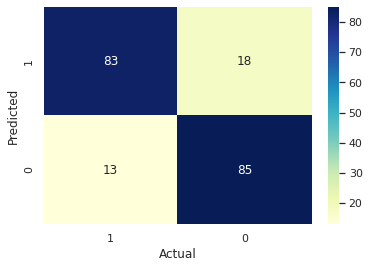

In [ ]:
nbcm = pd.DataFrame({'Actual': y_test, 'Predicted': nb_predict})
nbct = pd.crosstab(nbcm['Predicted'], nbcm['Actual'])
# Rearrange columns of ct
nbct = nbct[[1,0]]
nbct = nbct.reindex([1,0])
# Get the heatmap
sns.heatmap(nbct, annot=True, cmap="YlGnBu", fmt='g')

Get the Classification report

In [ ]:
nb_acc_score = accuracy_score(y_test, nb_predict)
nb_f1_score = f1_score(y_test, nb_predict)
nb_pre_score = precision_score(y_test, nb_predict)
nb_rec_score = recall_score(y_test, nb_predict)
print("\n")
print("Accuracy of Naive Bayes model:",nb_acc_score*100,'\n')
print(classification_report(y_test,nb_predict))



Accuracy of Naive Bayes model: 84.42211055276381 

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       103
           1       0.82      0.86      0.84        96

    accuracy                           0.84       199
   macro avg       0.84      0.84      0.84       199
weighted avg       0.85      0.84      0.84       199



## **K-Neighbors Classifier**

Find the best hyperparameters using Grid search and 5 fold Cross Validation

In [ ]:
knn = KNeighborsClassifier()
param_grid = {
    'n_neighbors': [5, 10, 20, 50, 70],
    'p': [1, 2],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}
knn_cv = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5)
knn_cv.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [5, 10, 20, 50, 70], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [ ]:
knn_cv.best_params_

{'algorithm': 'auto', 'n_neighbors': 20, 'p': 2, 'weights': 'distance'}

Fitting the model with best hyperparameters

In [ ]:
knn = KNeighborsClassifier(algorithm='auto', n_neighbors=20, p=2, weights='distance')
knn.fit(X_train, y_train)
knn_predicted = knn.predict(X_test)

Obtain a confusion matrix

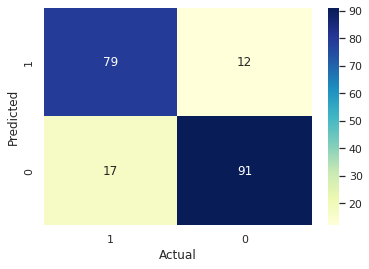

In [ ]:
knncm = pd.DataFrame({'Actual': y_test, 'Predicted': knn_predicted})
knnct = pd.crosstab(knncm['Predicted'], knncm['Actual'])
# Rearrange columns of ct
knnct = knnct[[1,0]]
knnct = knnct.reindex([1,0])
# Get the heatmap
sns.heatmap(knnct, annot=True, cmap="YlGnBu", fmt='g')

Classification Report

In [ ]:
knn_acc_score = accuracy_score(y_test, knn_predicted)
knn_f1_score = f1_score(y_test, knn_predicted)
knn_pre_score = precision_score(y_test, knn_predicted)
knn_rec_score = recall_score(y_test, knn_predicted)
print("\n")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score*100,'\n')
print(classification_report(y_test,knn_predicted))



Accuracy of K-NeighborsClassifier: 85.42713567839196 

              precision    recall  f1-score   support

           0       0.84      0.88      0.86       103
           1       0.87      0.82      0.84        96

    accuracy                           0.85       199
   macro avg       0.86      0.85      0.85       199
weighted avg       0.85      0.85      0.85       199



## **Decision Tree**

Find the best hyperparameters using Grid search and 5 fold Cross Validation

In [ ]:
dt = DecisionTreeClassifier(random_state=99)
param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [3,4,5,6,7,8],
    'max_features': ['auto', 'sqrt', 'log2']
}
dt_cv = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5)
dt_cv.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=99,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                     

In [ ]:
dt_cv.best_params_

{'criterion': 'gini',
 'max_depth': 7,
 'max_features': 'auto',
 'splitter': 'random'}

Build the model using best hyperparameters

In [ ]:
dt = DecisionTreeClassifier(random_state=99, criterion='gini', max_depth=7, max_features='auto', splitter='random')
dt.fit(X_train, y_train)
dt_predicted = dt.predict(X_test)

Obtain a confusion matrix

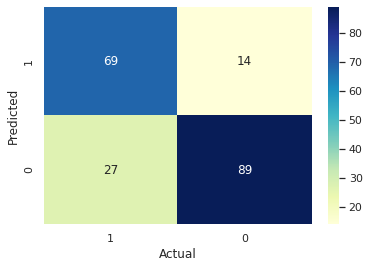

In [ ]:
dtcm = pd.DataFrame({'Actual': y_test, 'Predicted': dt_predicted})
dtct = pd.crosstab(dtcm['Predicted'], dtcm['Actual'])
# Rearrange columns of ct
dtct = dtct[[1,0]]
dtct = dtct.reindex([1,0])
# Get the heatmap
sns.heatmap(dtct, annot=True, cmap="YlGnBu", fmt='g')

Get the classification report

In [ ]:
dt_acc_score = accuracy_score(y_test, dt_predicted)
dt_f1_score = f1_score(y_test, dt_predicted)
dt_pre_score = precision_score(y_test, dt_predicted)
dt_rec_score = recall_score(y_test, dt_predicted)
print("\n")
print("Accuracy of DecisionTreeClassifier:",dt_acc_score*100,'\n')
print(classification_report(y_test,dt_predicted))



Accuracy of DecisionTreeClassifier: 79.39698492462311 

              precision    recall  f1-score   support

           0       0.77      0.86      0.81       103
           1       0.83      0.72      0.77        96

    accuracy                           0.79       199
   macro avg       0.80      0.79      0.79       199
weighted avg       0.80      0.79      0.79       199



Visualize the decision tree

In [ ]:
# Exporting as dot file
export_graphviz(dt, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = y_train_str,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in notebook
from IPython.display import Image
Image(filename = 'tree.png')

### Neural Network

Setting Model Parameters

In [ ]:
nn = Sequential()
# Adding the input layer and the first hidden layer
nn.add(Dense(units = 12, kernel_initializer = 'uniform', activation = 'relu', input_dim = 10))

# Adding the second hidden layer
nn.add(Dense(units = 6, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the third hidden layer
nn.add(Dense(units = 3, kernel_initializer = 'uniform', activation = 'relu'))

# Adding the output layer
nn.add(Dense(units = 1, kernel_initializer = 'uniform', activation = 'sigmoid'))

# Compiling the ANN
nn.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

Create a validation set from 20% of training data and use the rest to train the ANN

In [ ]:
nX_train, nX_val, ny_train, ny_val = train_test_split(X_train, y_train, test_size = .2, random_state=10)
history = nn.fit(nX_train, ny_train, epochs = 200, validation_data=(nX_val, ny_val))

Epoch 1/200
12/12 [==============================] - 2s 77ms/step - loss: 0.6932 - accuracy: 0.4907 - val_loss: 0.6931 - val_accuracy: 0.5054
Epoch 2/200
12/12 [==============================] - 0s 6ms/step - loss: 0.6930 - accuracy: 0.5216 - val_loss: 0.6931 - val_accuracy: 0.5054
Epoch 3/200
12/12 [==============================] - 0s 7ms/step - loss: 0.6930 - accuracy: 0.5162 - val_loss: 0.6930 - val_accuracy: 0.5054
Epoch 4/200
12/12 [==============================] - 0s 6ms/step - loss: 0.6926 - accuracy: 0.5326 - val_loss: 0.6928 - val_accuracy: 0.5054
Epoch 5/200
12/12 [==============================] - 0s 6ms/step - loss: 0.6926 - accuracy: 0.5110 - val_loss: 0.6923 - val_accuracy: 0.5054
Epoch 6/200
12/12 [==============================] - 0s 7ms/step - loss: 0.6910 - accuracy: 0.5515 - val_loss: 0.6911 - val_accuracy: 0.5054
Epoch 7/200
12/12 [==============================] - 0s 6ms/step - loss: 0.6901 - accuracy: 0.5246 - val_loss: 0.6890 - val_accuracy: 0.5054
Epoch 8/200


In [ ]:
nn_pred = nn.predict(X_test)
nn_predicted = nn_pred[:,0]
nn_predicted = nn_predicted.round()

Get the confusion matrix

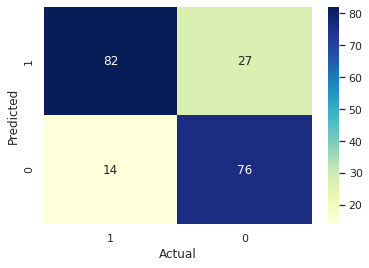

In [ ]:
nncm = pd.DataFrame({'Actual': y_test, 'Predicted': nn_predicted})
nnct = pd.crosstab(nncm['Predicted'], nncm['Actual'])
# Rearrange columns of ct
nnct = nnct[[1,0]]
nnct = nnct.reindex([1,0])
# Get the heatmap
sns.heatmap(nnct, annot=True, cmap="YlGnBu", fmt='g')

Get the classification report

In [ ]:
nn_acc_score = accuracy_score(y_test, nn_predicted)
nn_f1_score = f1_score(y_test, nn_predicted)
nn_pre_score = precision_score(y_test, nn_predicted)
nn_rec_score = recall_score(y_test, nn_predicted)
print("\n")
print("Accuracy of Neural Network:",nn_acc_score*100,'\n')
print(classification_report(y_test,nn_predicted))



Accuracy of Neural Network: 79.39698492462311 

              precision    recall  f1-score   support

           0       0.84      0.74      0.79       103
           1       0.75      0.85      0.80        96

    accuracy                           0.79       199
   macro avg       0.80      0.80      0.79       199
weighted avg       0.80      0.79      0.79       199



Plot Learning curves of ANN

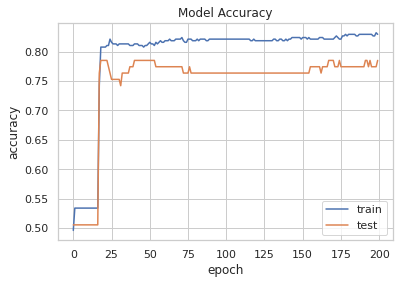

In [ ]:
# Model accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'])

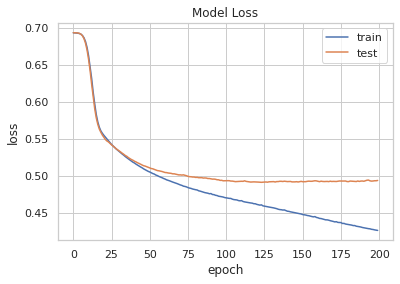

In [ ]:
# Model Losss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'])
plt.show()

### Performance summary of all the built models

Get an aggregated confusion matrix to compare models more conveniently

In [ ]:
pd.concat([lrct, knnct, nbct, svmct, rfct, nnct, dtct])

Actual,1,0
Predicted,,
1,82,14
0,14,89
1,79,12
0,17,91
1,83,18
0,13,85
1,79,15
0,17,88
1,78,17


Obtain a Summary Table of Performance matrix of all the built Classifiers

In [ ]:
data = [['Random Forest', rf_acc_score, rf_f1_score, rf_pre_score, rf_rec_score],
        ['Support Vector Classifier', svc_acc_score, svc_f1_score, svc_pre_score, svc_rec_score], 
        ['Logistic Regression', lr_acc_score, lr_f1_score, lr_pre_score, lr_rec_score],
        ['K-Nearest Neighbors', knn_acc_score, knn_f1_score, knn_pre_score, knn_rec_score],  
        ['Decision Tree', dt_acc_score, dt_f1_score, dt_pre_score, dt_rec_score],['Neural Network', nn_acc_score, nn_f1_score, nn_pre_score, nn_rec_score], 
        ['Naive Bayes', nb_acc_score, nb_f1_score, nb_pre_score, nb_rec_score]]
perf = pd.DataFrame(data=data, columns=['Model Name', 'Accuracy', 'F1 Score', 'Precision', 'Recall'])
perf[['Accuracy', 'F1 Score', 'Precision', 'Recall']] = perf[['Accuracy', 'F1 Score', 'Precision', 'Recall']]*100
perf.sort_values(by='Accuracy', ascending=False)

,Model Name,Accuracy,F1 Score,Precision,Recall
2,Logistic Regression,85.929648,85.416667,85.416667,85.416667
3,K-Nearest Neighbors,85.427136,84.491979,86.813187,82.291667
6,Naive Bayes,84.422111,84.263959,82.178218,86.458333
1,Support Vector Classifier,83.919598,83.157895,84.042553,82.291667
0,Random Forest,82.412060,81.675393,82.105263,81.250000
4,Decision Tree,79.396985,77.094972,83.132530,71.875000
5,Neural Network,79.396985,80.000000,75.229358,85.416667


## Voting/Stacking Classifier

Ensemble with the best classisifiers

In [ ]:
# All models (dt, knn, xgb, rf, nb, lr, svc)
voting_clf = VotingClassifier(estimators=[('LR', lr), ('KNN', knn), ('NB', nb)], voting='soft')
voting_clf.fit(X_train, y_train)
preds = voting_clf.predict(X_test)

View actual and predicted in dataframe

In [ ]:
ensemble_df = pd.DataFrame({'Actual': y_test, 'Predicted': preds})
comparedf = pd.concat([X_test_uns, ensemble_df], axis=1)
comparedf.head(15)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,Actual,Predicted
803,62,1,4,135,297,0.0,0.0,130,1.0,1.0,1,1
78,48,1,2,130,245,0.0,2.0,180,0.0,0.2,0,0
736,63,1,4,170,177,0.0,0.0,84,1.0,2.5,1,1
630,31,0,2,100,219,0.0,1.0,150,0.0,0.0,0,0
169,45,0,2,112,160,0.0,0.0,138,0.0,0.0,0,0
272,46,1,4,140,311,0.0,0.0,120,1.0,1.8,1,1
220,41,0,3,112,268,0.0,2.0,172,1.0,0.0,0,0
235,54,1,4,122,286,0.0,2.0,116,1.0,3.2,1,1
253,51,0,3,120,295,0.0,2.0,157,0.0,0.6,0,0
495,44,1,4,150,412,0.0,0.0,170,0.0,0.0,0,0


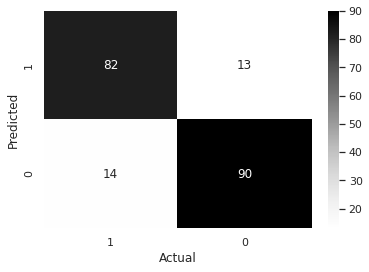

In [ ]:
ensemble_df = pd.DataFrame({'Actual': y_test, 'Predicted': preds})
ensemble_ct = pd.crosstab(ensemble_df['Predicted'], ensemble_df['Actual'])
# Rearrange columns of ct
ensemble_ct = ensemble_ct[[1,0]]
ensemble_ct = ensemble_ct.reindex([1,0])
# Get the heatmap
sns.heatmap(ensemble_ct, annot=True, cmap="Greys", fmt='g')

In [ ]:
ensemble_acc_score = accuracy_score(y_test, preds)
print("\n")
print("Accuracy of Ensemble Classifier:",ensemble_acc_score*100,'\n')
print(classification_report(y_test,preds, digits=4))



Accuracy of Ensemble Classifier: 86.4321608040201 

              precision    recall  f1-score   support

           0     0.8654    0.8738    0.8696       103
           1     0.8632    0.8542    0.8586        96

    accuracy                         0.8643       199
   macro avg     0.8643    0.8640    0.8641       199
weighted avg     0.8643    0.8643    0.8643       199



Note: Hard voting ensemble decreases accuracy but soft voting increases the metrics

# Result Analysis

Get the Area under the ROC curves of best classifiers

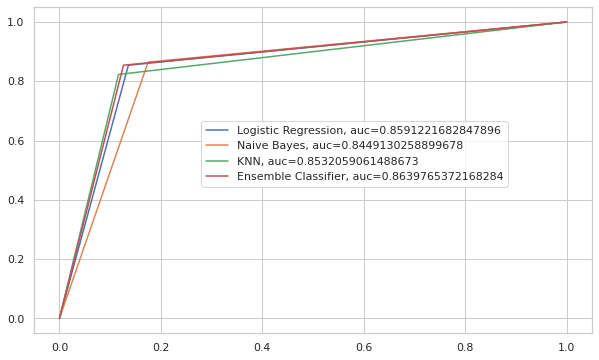

In [ ]:
plt.figure(figsize=(10,6))
pred = np.random.rand(1000)
label = np.random.randint(2, size=1000)
fpr, tpr, thresh = roc_curve(y_test, lr_predict)
auc = roc_auc_score(y_test, lr_predict)
plt.plot(fpr,tpr,label="Logistic Regression, auc="+str(auc))

pred = np.random.rand(1000)
label = np.random.randint(2, size=1000)
fpr, tpr, thresh = roc_curve(y_test, nb_predict)
auc = roc_auc_score(y_test, nb_predict)
plt.plot(fpr,tpr,label="Naive Bayes, auc="+str(auc))

pred = np.random.rand(1000)
label = np.random.randint(2, size=1000)
fpr, tpr, thresh = roc_curve(y_test, knn_predicted)
auc = roc_auc_score(y_test, knn_predicted)
plt.plot(fpr,tpr,label="KNN, auc="+str(auc))

pred = np.random.rand(1000)
label = np.random.randint(2, size=1000)
fpr, tpr, thresh = roc_curve(y_test, preds)
auc = roc_auc_score(y_test, preds)
plt.plot(fpr,tpr,label="Ensemble Classifier, auc="+str(auc))
plt.legend(loc=(0.3,0.45))

### Importance of features

In [ ]:
perm = PermutationImportance(voting_clf, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = feature_names)

Weight,Feature
0.0955 ± 0.0422,oldpeak
0.0643 ± 0.0314,exang
0.0623 ± 0.0288,sex
0.0482 ± 0.0322,cp
0.0322 ± 0.0274,thalach
0.0121 ± 0.0136,fbs
0.0111 ± 0.0215,trestbps
0.0101 ± 0.0305,age
0.0050 ± 0.0127,restecg
0.0050 ± 0.0110,chol


Get Partial Dependence plots to know how the model's target is manipulated by the values of a variable

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


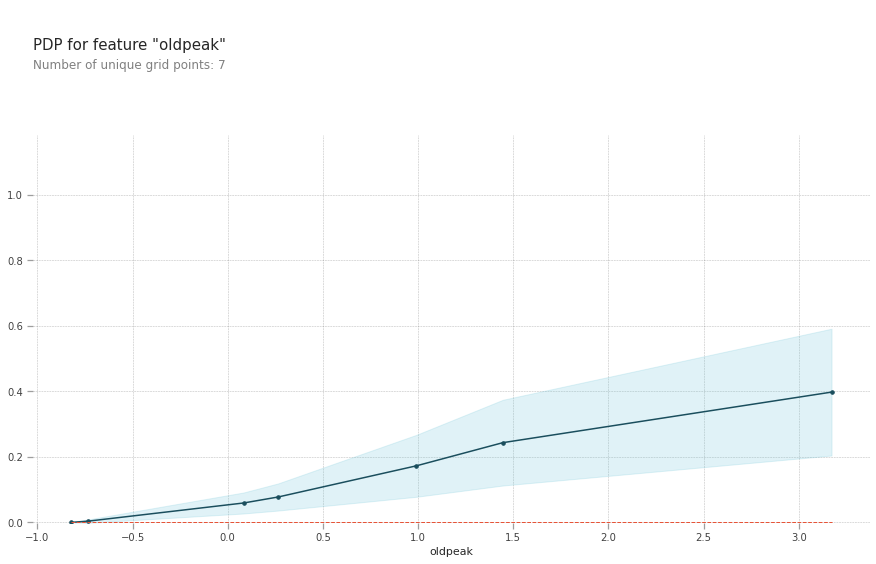

In [ ]:
X_testdf = pd.DataFrame(X_test, columns = feature_names)
feat_name = 'oldpeak'
pdp_dist = pdp.pdp_isolate(model=voting_clf, dataset=X_testdf, model_features=feature_names, feature=feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

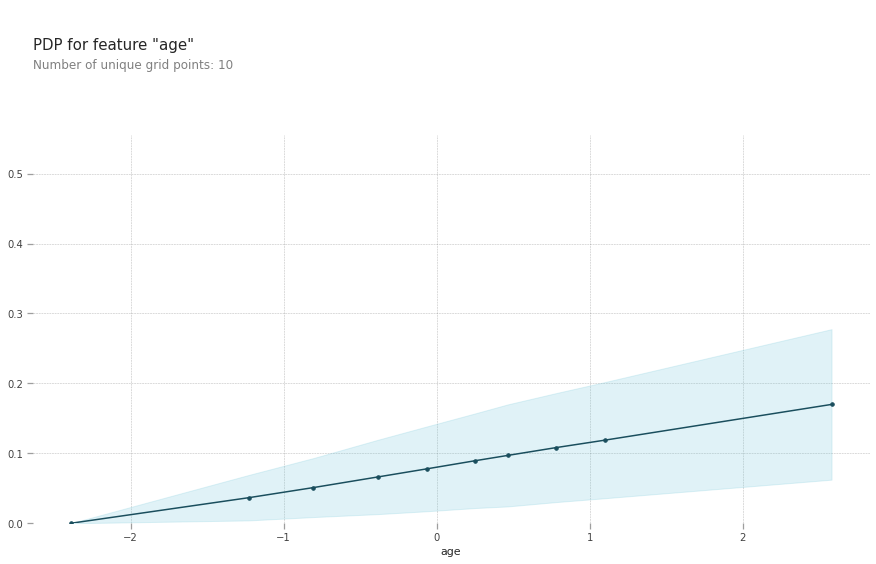

In [ ]:
feat_name = 'age'
pdp_dist = pdp.pdp_isolate(model=voting_clf, dataset=X_testdf, model_features=feature_names, feature=feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

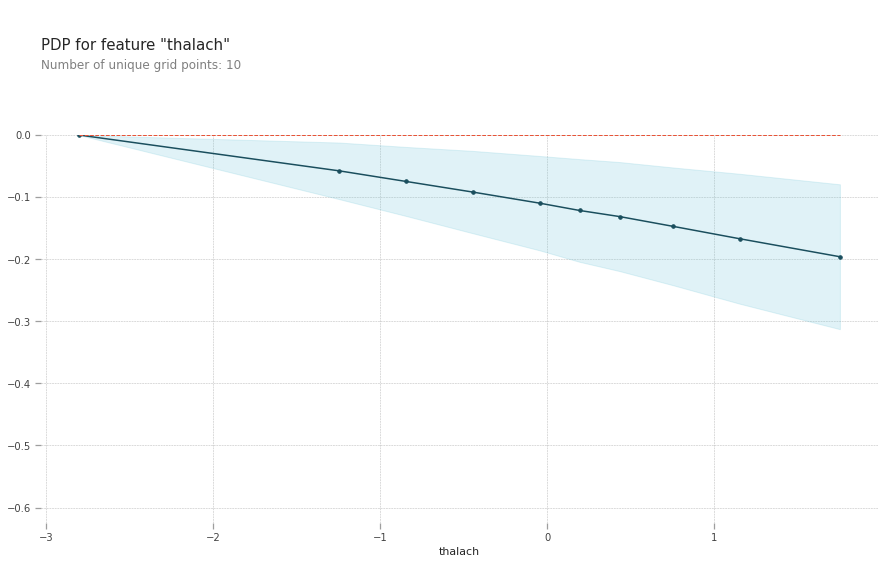

In [ ]:
feat_name = 'thalach'
pdp_dist = pdp.pdp_isolate(model=voting_clf, dataset=X_testdf, model_features=feature_names, feature=feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

Inference: The higher the age and oldpeak value, the higher is the chance to be diagnosed with CAD. But the lower the thalach is the better it is.

### Analyzing Predictions
to understand why a model labels an unseen sample into a particular class (CAD or non CAD), we choose an arbitrary sample and see what forces drive the model into a prediction

In [ ]:
row_to_show = 5
data_for_prediction = X_testdf.iloc[row_to_show]
k_explainer = shap.KernelExplainer(lr.predict_proba, X_test)

Using 199 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


Features of the chosen sample

In [ ]:
X_test_uns.iloc[5]

age          46.0
sex           1.0
cp            4.0
trestbps    140.0
chol        311.0
fbs           0.0
restecg       0.0
thalach     120.0
exang         1.0
oldpeak       1.8
Name: 272, dtype: float64

Scaled Features of the chosen sample

In [ ]:
X_testdf.iloc[5]


age        -0.699841
sex         0.590745
cp          0.864224
trestbps    0.405388
chol        1.121381
fbs        -0.419710
restecg    -0.756897
thalach    -0.846250
exang       1.286320
oldpeak     0.810043
Name: 5, dtype: float64

Shap plot in a forced additive layout

In [ ]:
shap.initjs()
#data_for_prediction_array = data_for_prediction.values.reshape(1, -1)
k_shap_values = k_explainer.shap_values(data_for_prediction)
shap.force_plot(k_explainer.expected_value[1], k_shap_values[1], data_for_prediction)

A summary plot

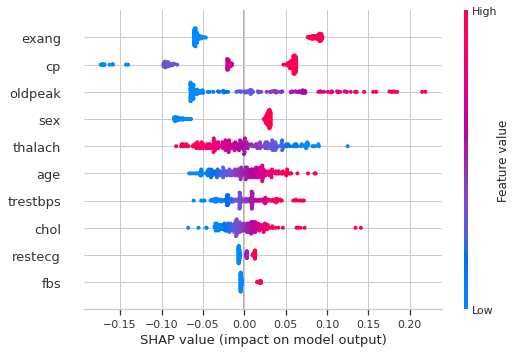

In [ ]:
k_shap_values = k_explainer.shap_values(X_test)
shap.summary_plot(k_shap_values[1], X_test, feature_names=feature_names)

In [ ]:
pd.concat([lrct, knnct, nbct, svmct, rfct, nnct, dtct])

Actual,1,0
Predicted,,
1,82,14
0,14,89
1,79,12
0,17,91
1,83,18
0,13,85
1,79,15
0,17,88
1,78,17
